In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
folders = {
    "Black": "/content/drive/MyDrive/soyabean/black",
    "Brown": "/content/drive/MyDrive/soyabean/brown",
    "Unfit": "/content/drive/MyDrive/soyabean/unfit"
}

In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans


Processing category: Black


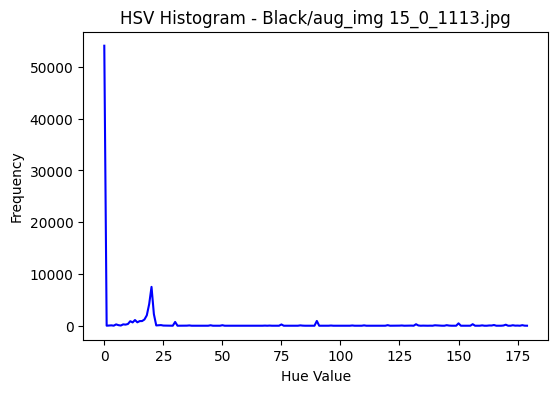

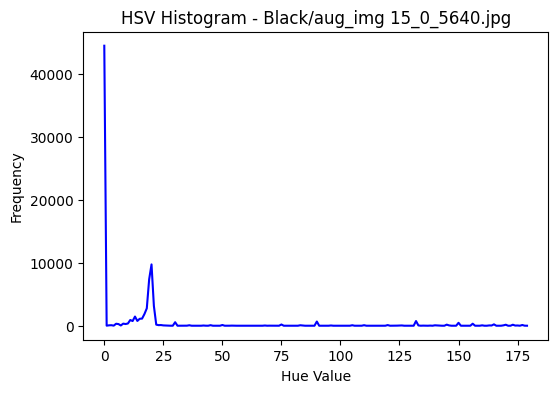

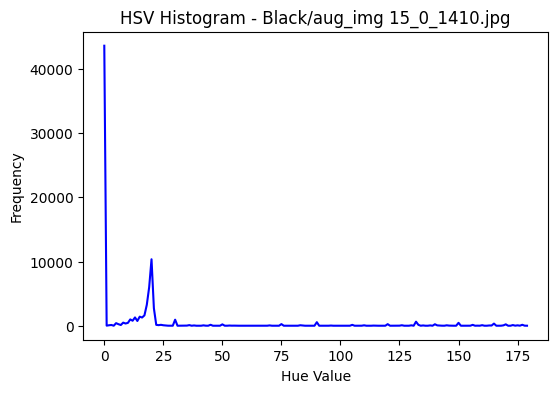

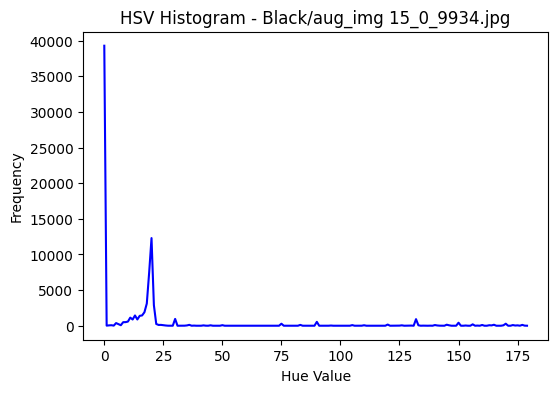

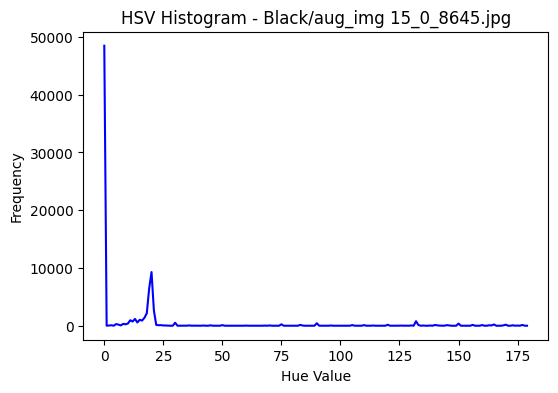

...

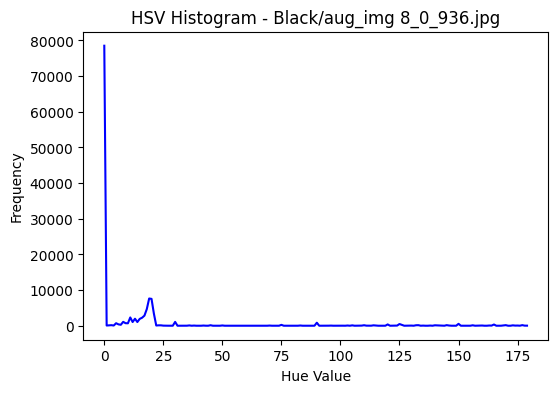

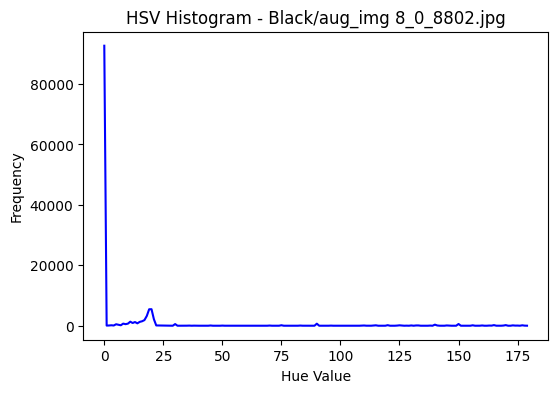

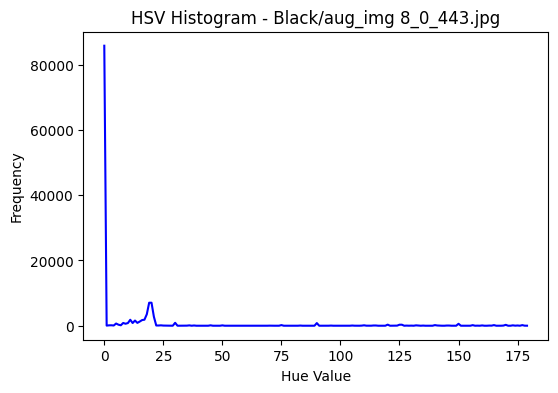

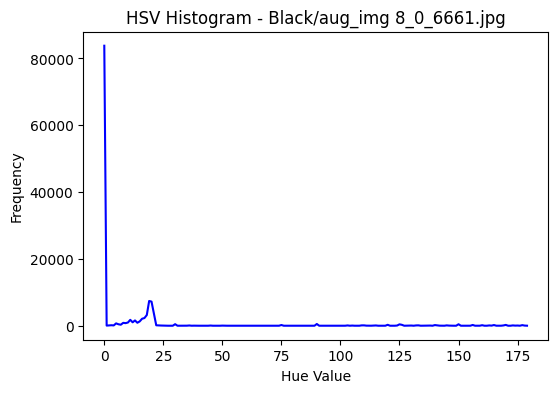

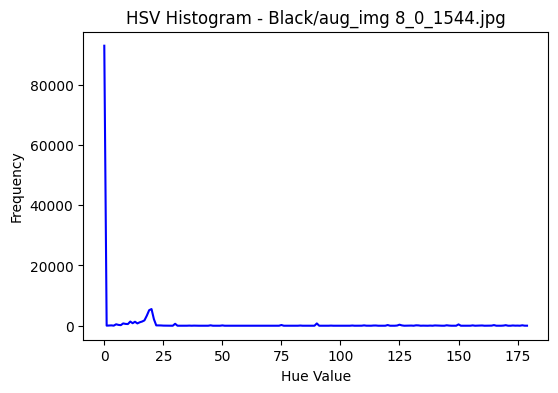


Processing category: Brown


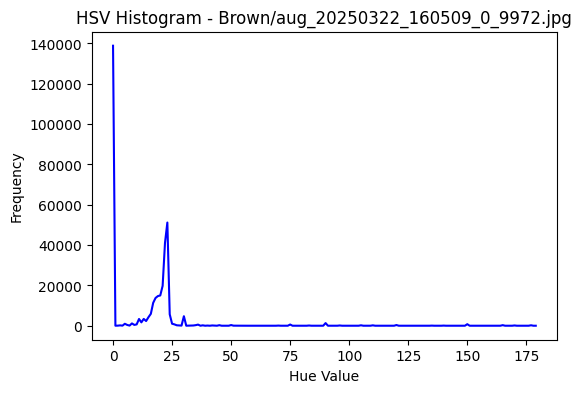

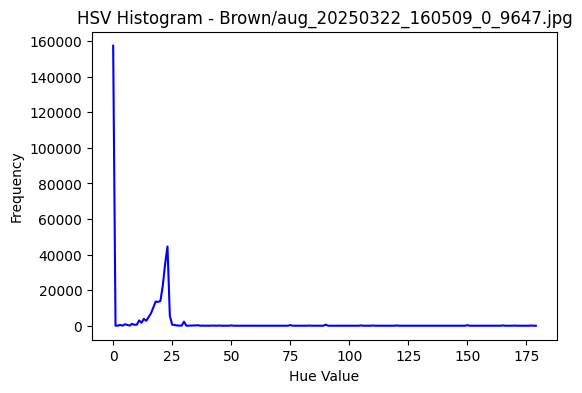

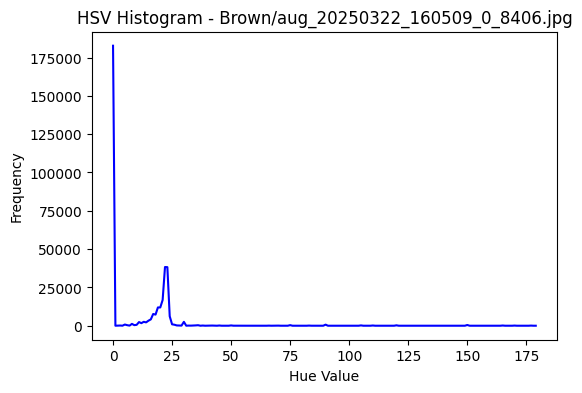

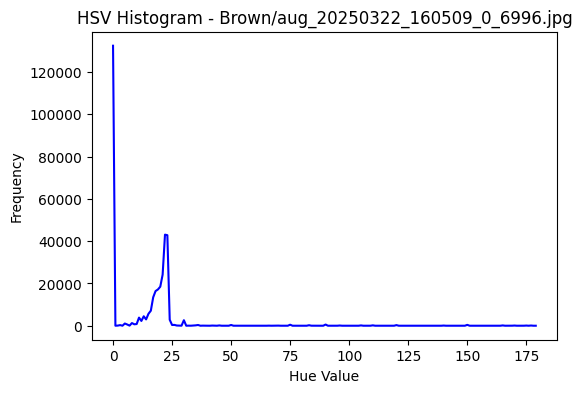

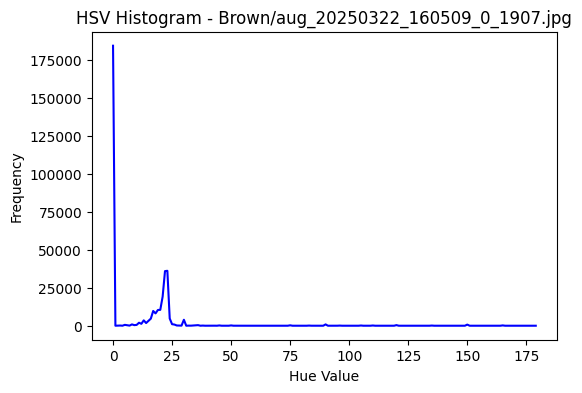

...

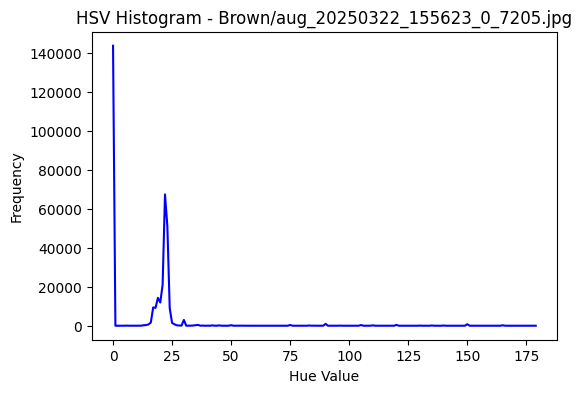

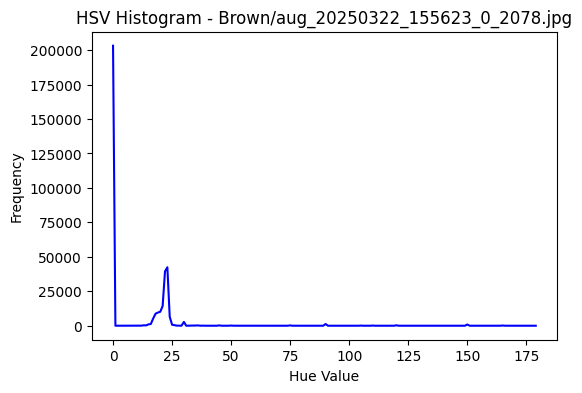

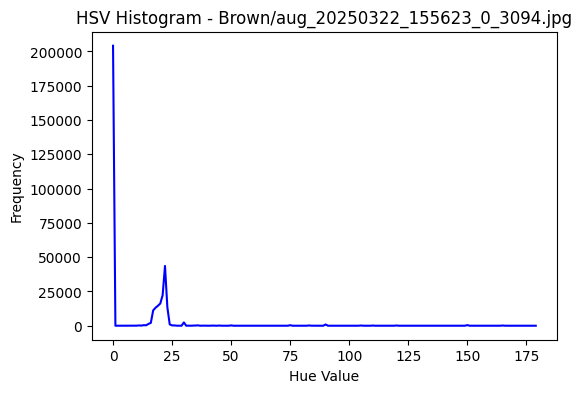

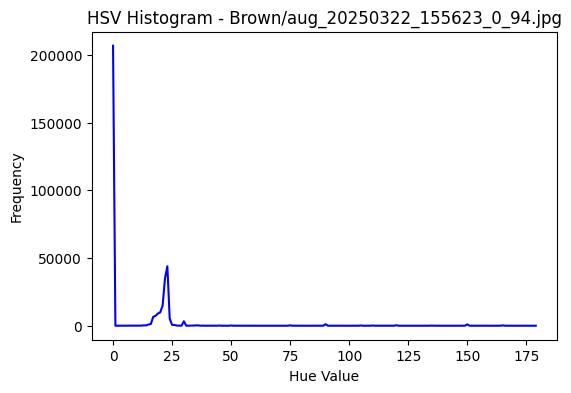

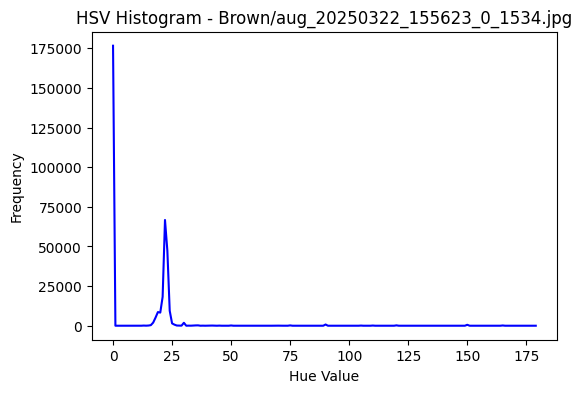


Processing category: Unfit


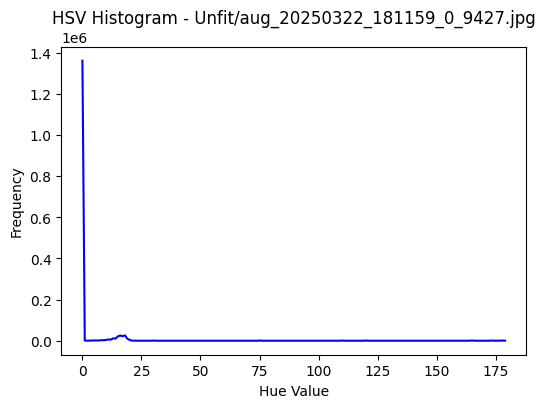

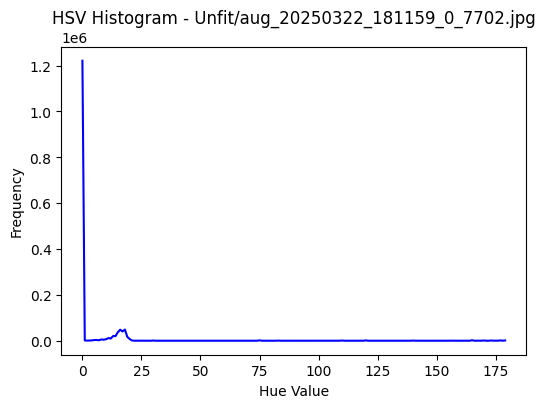

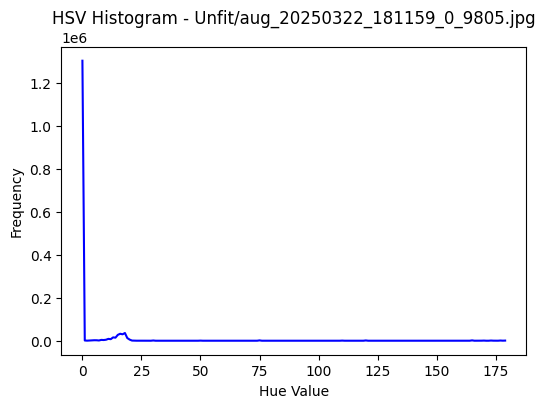

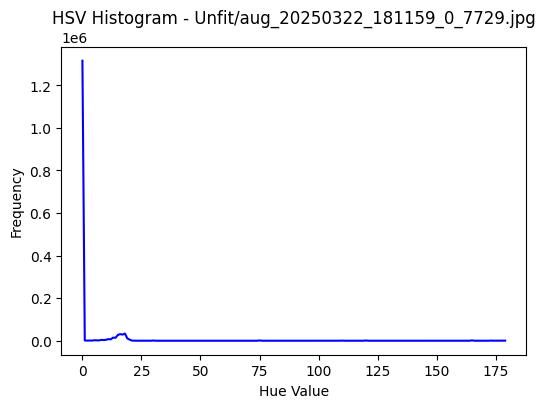

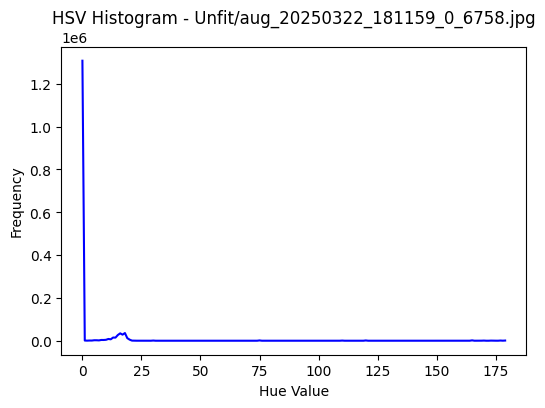

...

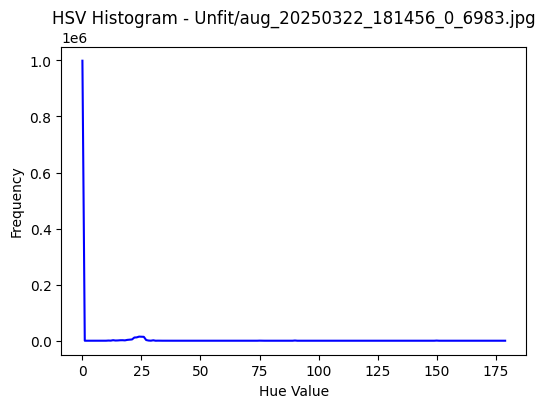

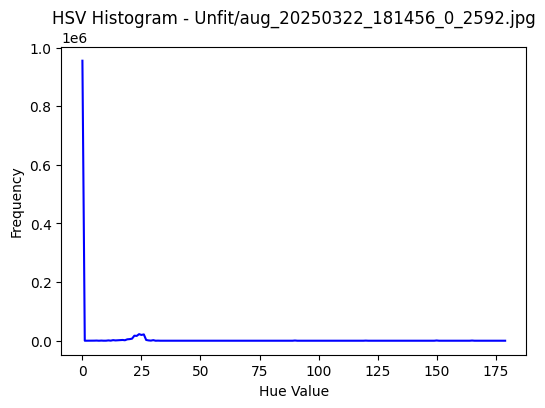

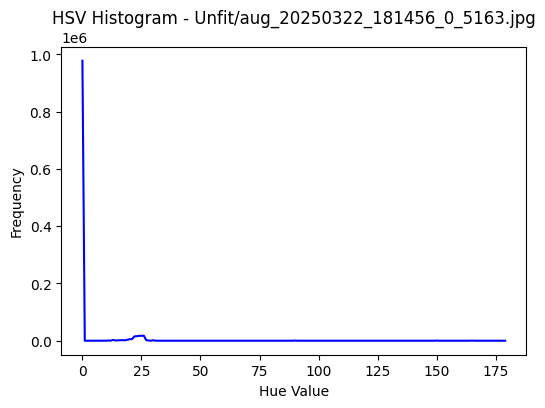

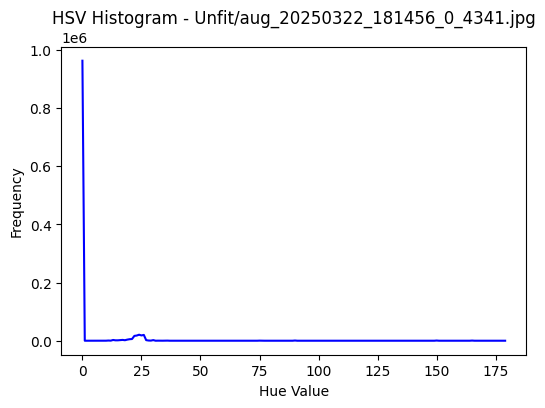

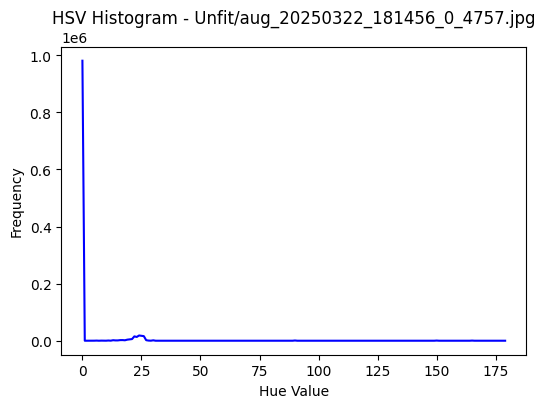

{'Category': 'Black', 'Filename': 'aug_img 15_0_1113.jpg', 'Mean Brightness': np.float64(209.33128375771605), 'Std Brightness': np.float64(72.4978390569777), 'Dominant Color (HSV)': array([  5,   0, 254])}
{'Category': 'Black', 'Filename': 'aug_img 15_0_5640.jpg', 'Mean Brightness': np.float64(191.0252941743827), 'Std Brightness': np.float64(78.82603503809295), 'Dominant Color (HSV)': array([  6,   0, 254])}
{'Category': 'Black', 'Filename': 'aug_img 15_0_1410.jpg', 'Mean Brightness': np.float64(191.37544608410494), 'Std Brightness': np.float64(78.66922352945845), 'Dominant Color (HSV)': array([  7,   0, 253])}
{'Category': 'Black', 'Filename': 'aug_img 15_0_9934.jpg', 'Mean Brightness': np.float64(180.6287736304012), 'Std Brightness': np.float64(81.08539895873093), 'Dominant Color (HSV)': array([  6,   0, 254])}
{'Category': 'Black', 'Filename': 'aug_img 15_0_8645.jpg', 'Mean Brightness': np.float64(196.79093123070987), 'Std Brightness': np.float64(78.67619765335822), 'Dominant Color 

In [ ]:
# Function to compute Mean & Standard Deviation in LAB (L-channel for brightness)
def compute_mean_std(image):
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)  # Convert to LAB
    l_channel, _, _ = cv2.split(lab)  # Extract L (Lightness) channel
    mean, std = cv2.meanStdDev(l_channel)
    return mean[0][0], std[0][0]  # Return scalar values

# Function to compute histogram for HSV (H-channel for hilum color)
def compute_histogram(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)  # Convert to HSV
    h_channel = hsv[:, :, 0]  # Extract Hue
    hist = cv2.calcHist([h_channel], [0], None, [180], [0, 180])  # Hue histogram
    return hist

# Function to extract dominant color using K-Means clustering
def dominant_color(image, k=3):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)  # Convert to HSV
    pixels = hsv.reshape((-1, 3))  # Reshape to 2D
    kmeans = KMeans(n_clusters=k, n_init=10)
    kmeans.fit(pixels)

    unique, counts = np.unique(kmeans.labels_, return_counts=True)
    dominant = kmeans.cluster_centers_[np.argmax(counts)]  # Find most common cluster

    return dominant.astype(int)  # Return dominant color in HSV

# Process all images
results = []

for category, folder in folders.items():
    print(f"\nProcessing category: {category}")
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        image = cv2.imread(img_path)

        if image is None:
            continue  # Skip invalid images

        # Step 1: Mean & Std for brightness analysis (LAB L-Channel)
        mean_brightness, std_brightness = compute_mean_std(image)

        # Step 2: Compute Hue histogram (HSV H-Channel)
        hist = compute_histogram(image)

        # Step 3: Extract dominant color (HSV)
        dominant_hsv = dominant_color(image)

        # Save results
        results.append({
            "Category": category,
            "Filename": filename,
            "Mean Brightness": mean_brightness,
            "Std Brightness": std_brightness,
            "Dominant Color (HSV)": dominant_hsv
        })

        # Display histogram (optional)
        plt.figure(figsize=(6, 4))
        plt.plot(hist, color='blue')
        plt.title(f"HSV Histogram - {category}/{filename}")
        plt.xlabel("Hue Value")
        plt.ylabel("Frequency")
        plt.show()

# Print summary
for res in results:
    print(res)

In [ ]:
import pandas as pd

# Convert results list to a DataFrame
df = pd.DataFrame(results)

# Save to CSV
df.to_csv("soybean_results.csv", index=False)

print("Results saved to soybean_results.csv")


Results saved to soybean_results.csv
